In [7]:
import pandas as pd
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import  cross_val_score
from copy import deepcopy
from analyze_tools import *

In [8]:
df = pd.read_csv('../data/clean_game_data.csv', index_col=0).drop(columns=['Year', 'Game ID'])
df['Victory'] = df['Victory'].astype(int)
top_df = deepcopy(df[df['Role'] == 'TOP'].select_dtypes(include='number')).astype('float64').drop(columns=['Victory'])
mid_df = deepcopy(df[df['Role'] == 'MID'].select_dtypes(include='number')).astype('float64').drop(columns=['Victory'])
jg_df =  deepcopy(df[df['Role'] == 'JUNGLE'].select_dtypes(include='number')).astype('float64').drop(columns=['Victory'])
adc_df =  deepcopy(df[df['Role'] == 'ADC'].select_dtypes(include='number')).astype('float64').drop(columns=['Victory'])
sup_df = deepcopy(df[df['Role'] == 'SUPPORT'].select_dtypes(include='number')).astype('float64').drop(columns=['Victory'])

scaler = StandardScaler()
top_df[:] = scaler.fit_transform(top_df)
mid_df[:] = scaler.fit_transform(mid_df)
jg_df[:] = scaler.fit_transform(jg_df)
adc_df[:] = scaler.fit_transform(adc_df)
sup_df[:] = scaler.fit_transform(sup_df)

In [9]:
top_df.head()

,Game Duration,Kills,Deaths,Assists,KDA,CS,CS in Team's Jungle,CSM,Golds,GPM,...,Quadra kills,Penta kills,GD@15,CSD@15,XPD@15,LVLD@15,Damage dealt to turrets,Total heal,Time ccing others,Total damage taken
Column,,,,,,,,,,,,,,,,,,,,,
0,-0.380480,-0.682033,0.723506,-1.097586,-0.899559,-0.072878,0.103691,0.383739,-0.562419,-0.435131,...,-0.060486,-0.027568,-0.231768,-1.435169,-0.080463,0.000000,-0.856888,0.304455,-0.459269,0.392782
5,-0.380480,1.201569,-0.376180,-0.231635,0.075326,1.825943,2.475098,3.501551,1.289056,2.627057,...,-0.060486,-0.027568,0.231768,1.435169,0.080463,0.000000,0.902773,-0.445416,0.112445,-0.648944
0,-0.478429,-1.152934,1.823193,-1.097586,-0.972675,-1.416383,0.806330,-1.754188,-1.619240,-2.100531,...,-0.060486,-0.027568,-1.521277,-2.057076,-1.326378,-1.268151,-1.162971,0.077180,-0.205174,0.127010
5,-0.478429,1.201569,-0.926023,0.345666,1.659514,0.482438,1.860289,1.452703,0.670481,1.767495,...,-0.060486,-0.027568,1.521277,2.057076,1.326378,1.268151,1.639839,0.507055,-0.903936,-0.050929
0,-1.198277,-1.152934,1.823193,-0.520285,-0.899559,-1.058115,-0.950268,-0.150742,-1.252913,-0.614206,...,-0.060486,-0.027568,-0.318562,0.000000,-1.292432,-1.268151,-0.992854,-1.033747,-0.268698,-1.135379


In [10]:
pca3_mid = PCA(n_components=3)
pca3_top = PCA(n_components=3)
pca3_jg = PCA(n_components=3)
pca3_adc = PCA(n_components=3)
pca3_sup = PCA(n_components=3)

pca3_mid_df = pd.DataFrame(pca3_mid.fit_transform(mid_df), columns=['PC1', 'PC2', 'PC3'])
pca3_top_df = pd.DataFrame(pca3_top.fit_transform(top_df), columns=['PC1', 'PC2', 'PC3'])
pca3_jg_df = pd.DataFrame(pca3_jg.fit_transform(jg_df), columns=['PC1', 'PC2', 'PC3'])
pca3_adc_df = pd.DataFrame(pca3_adc.fit_transform(adc_df), columns=['PC1', 'PC2', 'PC3'])
pca3_sup_df = pd.DataFrame(pca3_sup.fit_transform(sup_df), columns=['PC1', 'PC2', 'PC3'])

In [11]:
pca3_top_df

,PC1,PC2,PC3
0,-2.575056,0.109917,-1.923884
1,4.627829,-5.138241,-1.788916
2,-5.312082,0.872106,0.505613
3,4.596879,-4.034368,0.227975
4,-3.570194,0.165981,-0.412186
...,...,...,...
13163,0.062590,3.025928,-0.937354
13164,1.099498,0.286281,1.184250
13165,-2.180194,-0.256910,0.441086
13166,1.099498,0.286281,1.184250


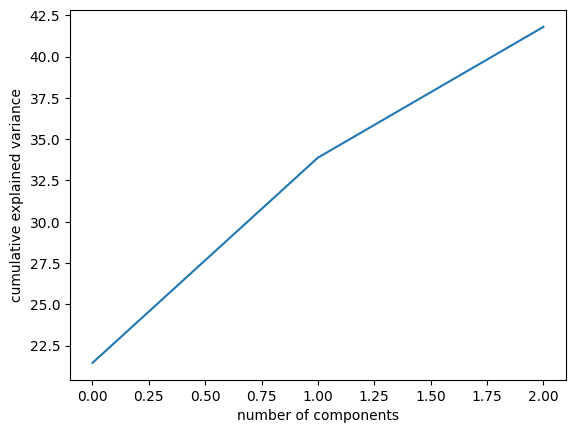

In [14]:
# Top

# cumulated explained variance

explained_variance = pca3_top.explained_variance_ratio_
explained_variance_cum = np.cumsum(explained_variance) * 100
plt.plot(explained_variance_cum)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters)
pred = kmeans.fit_predict(pca3_top_df)
px.scatter(pca3_top_df, x='PC1', y='PC2', color=pred).show()
show_pca_correlation_circle(pca3_top, top_df, component_1 = 1, component_2 = 2)
px.scatter(pca3_top_df, x='PC1', y='PC3', color=pred).show()
show_pca_correlation_circle(pca3_top, top_df, component_1 = 1, component_2 = 3)
px.scatter_3d(pca3_top_df, x='PC1', y='PC2', z='PC3', color=pred).show()

Tried Kmeans for 4 toplaner profiles

PC1 :
- Axis looks like it prioritize stats that would help increase the amount of gold held in the long run or be the expression of the latter.
- Deaths does not increase gold = negative
- Others stats are more or less useful, ranging from low link (wards, time cc-ing, IE indirect) to direct cause or consequence (Kills, CS, Gold held which is the highest)

PC2 :
- negative = confrontational, aggressive (kills, CS farm and differential @15 to enemy)
- positive = supportive (wards)

PC3 :
- harder to recognize
- Negative = differential stats, ressource intensive stats (farm), scaling
- Positive = Direct impact on the map and kills / assist

Cluster analysis :

- Cluster 0 : Mostly medriocre performance and dies a lot, seem to usually take more ressources.

- Cluster 1 : Aggressive, deals damage to the enemy, has balanced impact and balanced ressource usage

- Cluster 2 : More supportive type of toplaners, tries to leverage scaling / ressources

- Cluster 3 : Average toplaner

In [17]:
# Cluster winrate

new_top_df = deepcopy(top_df)
new_top_df['Cluster'] = pred
new_top_df['Victory'] = df[df['Role'] == 'TOP']['Victory']
print(new_top_df.groupby('Cluster').mean()['Victory'] * 100)

Cluster
0    18.841251
1    81.737326
2    57.717570
3    52.825230
Name: Victory, dtype: float64


In [18]:
# Mid

n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters)
pred = kmeans.fit_predict(pca3_mid_df)
px.scatter(pca3_mid_df, x='PC1', y='PC2', color=pred).show()
show_pca_correlation_circle(pca3_mid, mid_df, component_1 = 1, component_2 = 2)
px.scatter(pca3_mid_df, x='PC1', y='PC3', color=pred).show()
show_pca_correlation_circle(pca3_mid, mid_df, component_1 = 1, component_2 = 3)
px.scatter_3d(pca3_mid_df, x='PC1', y='PC2', z='PC3', color=pred).show()

# Cluster winrate

new_mid_df = deepcopy(mid_df)
new_mid_df['Cluster'] = pred
new_mid_df['Victory'] = df[df['Role'] == 'MID']['Victory']
print(new_mid_df.groupby('Cluster').mean()['Victory'] * 100)


Cluster
0    49.689668
1    85.922186
2    66.769547
3    20.164127
Name: Victory, dtype: float64


In [19]:
# Jungle


n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters)
pred = kmeans.fit_predict(pca3_jg_df)
px.scatter(pca3_jg_df, x='PC1', y='PC2', color=pred).show()
show_pca_correlation_circle(pca3_jg, jg_df, component_1 = 1, component_2 = 2)
px.scatter(pca3_jg_df, x='PC1', y='PC3', color=pred).show()
show_pca_correlation_circle(pca3_jg, jg_df, component_1 = 1, component_2 = 3)
px.scatter_3d(pca3_jg_df, x='PC1', y='PC2', z='PC3', color=pred).show()

# Cluster winrate

new_jg_df = deepcopy(jg_df)
new_jg_df['Cluster'] = pred
new_jg_df['Victory'] = df[df['Role'] == 'JUNGLE']['Victory']
print(new_jg_df.groupby('Cluster').mean()['Victory'] * 100)


Cluster
0    85.620053
1    55.539089
2    24.425741
3    63.206459
Name: Victory, dtype: float64


In [20]:
# ADC

n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters)
pred = kmeans.fit_predict(pca3_adc_df)
px.scatter(pca3_adc_df, x='PC1', y='PC2', color=pred).show()
show_pca_correlation_circle(pca3_adc, adc_df, component_1 = 1, component_2 = 2)
px.scatter(pca3_adc_df, x='PC1', y='PC3', color=pred).show()
show_pca_correlation_circle(pca3_adc, adc_df, component_1 = 1, component_2 = 3)
px.scatter_3d(pca3_adc_df, x='PC1', y='PC2', z='PC3', color=pred).show()

# Cluster winrate

new_adc_df = deepcopy(adc_df)
new_adc_df['Cluster'] = pred
new_adc_df['Victory'] = df[df['Role'] == 'ADC']['Victory']
print(new_adc_df.groupby('Cluster').mean()['Victory'] * 100)

Cluster
0    90.111780
1    15.348837
2    66.862038
3    42.905635
Name: Victory, dtype: float64


In [21]:
# Support

n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters)
pred = kmeans.fit_predict(pca3_sup_df)
px.scatter(pca3_sup_df, x='PC1', y='PC2', color=pred).show()
show_pca_correlation_circle(pca3_sup, sup_df, component_1 = 1, component_2 = 2)
px.scatter(pca3_sup_df, x='PC1', y='PC3', color=pred).show()
show_pca_correlation_circle(pca3_sup, sup_df, component_1 = 1, component_2 = 3)
px.scatter_3d(pca3_sup_df, x='PC1', y='PC2', z='PC3', color=pred).show()

# Cluster winrate

new_sup_df = deepcopy(sup_df)
new_sup_df['Cluster'] = pred
new_sup_df['Victory'] = df[df['Role'] == 'SUPPORT']['Victory']
print(new_sup_df.groupby('Cluster').mean()['Victory'] * 100)


Cluster
0    84.056713
1    22.825681
2    55.017739
3    69.852941
Name: Victory, dtype: float64
